In [2]:
# Agent Libraries
from mesa import Agent, Model
from mesa.time import RandomActivation
# Drone Simulation Libraries
import dronekit_sitl
from dronekit import connect, VehicleMode
# Visualization Libraries
%matplotlib inline
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
# Helper Libraries
import logging
import random
import copy
import time
import math
from IPython.display import clear_output

#=================================================
#|                GLOBAL VARIABLES               |
#=================================================
# Make graphs interactive
%matplotlib notebook
logging.basicConfig(level=logging.INFO, filename='simulation.log')

In [3]:
class WorldMap():
    '''Array containing world representation'''
    def __init__(self, dimensions, numTargets):
        self.myMap = [[1 for i in range(dimensions)] for j in range(dimensions)]

        # Definition of map features
        # {
        # 9: target
        # 4: mapped, lower elevation, drone must descend
        # 3: mapped, mapped higher elevation. Drone must ascend
        # 2: mapped, impassible space (cannot fly through or above)
        # 1: mapped, uninteresting space
        # 0: unknown space (relative to agent which only knows how large the world is
        # }
        # Randomly add features to map
        # Lower and high elevation spaces will tend to be clumped together
        numLow = random.randint(dimensions//4, dimensions//2)
        for count in range(numLow):
            x = random.randint(1,dimensions-2)
            y = random.randint(1,dimensions-2)
            self.myMap[x][y] = 4
            if random.random() > 0.5:
                self.myMap[x-1][y-1] = 4
            elif random.random() < 0.5:
                self.myMap[x+1][y-1] = 4
            elif random.random() > 0.75:
                self.myMap[x+1][y+1] = 4
            elif random.random() < 0.75:
                self.myMap[x-1][y+1] = 4

        numHigh = random.randint(dimensions//4, dimensions//2)
        for count in range(numHigh):
            x = random.randint(1,dimensions-2)
            y = random.randint(1,dimensions-2)
            self.myMap[x][y] = 3
            if random.random() > 0.5:
                self.myMap[x-1][y-1] = 3
            if random.random() > 0.5:
                self.myMap[x+1][y-1] = 3
            if random.random() > 0.75:
                self.myMap[x+1][y+1] = 3
            if random.random() > 0.75:
                self.myMap[x-1][y+1] = 3
        # Create impassible ridges within map
        numRidge = random.randint(1, dimensions//2)
        for count in range(numRidge):
            y = random.randint(1,dimensions-2)
            for x in range(random.randint(1, dimensions//4), random.randint(1, dimensions//4)):
                self.myMap[x][y] = 2
            x = random.randint(1,dimensions-2)
            for y in range(random.randint(1, dimensions//4), random.randint(1, dimensions//4)):
                self.myMap[x][y] = 2
                
        # Make borders impassible
        for x in range(dimensions):
            for y in range(dimensions):
                if x == 0 or y == 0 or x == (dimensions - 1) or y == (dimensions - 1):
                    self.myMap[x][y] = 2
        # Place the targets on map, clustering them near each other
        count = 0
        clustered = 0
        x = None
        y = None
        clusteredMax = random.randint(1, numTargets//2)
        while count < numTargets:
            if x and y:
                newX = x + random.randint(-2,2)
                newY = y + random.randint(-2,2)
                try:
                    if self.myMap[newX][newY] != 9:
                        self.myMap[newX][newY] = 9
                        count+=1
                        clustered+=1
                except:
                    # Out of bounds error
                    pass
            if clustered > clusteredMax - 1:
                x = None
                y = None
                clustered = 0
                continue
                
            # Base case which we fall into to redefine x and y
            x = random.randint(1,dimensions-2)
            y = random.randint(1,dimensions-2)
            self.myMap[x][y] = 9
            count += 1
            
                    
    def show(self):
        '''Display heatmap representation of world map'''
        ax = sns.heatmap(self.myMap, linewidth=0.5, cmap="YlGnBu")
        plt.show()
        
    def getData(self, x, y):
        return self.myMap[x][y]
    
    def setData(self, x, y, data):
        self.myMap[x][y] = data

In [4]:
class DroneAgent(Agent):
    '''Initialize agent with drone object'''
    def __init__(self, unique_id, model, worldmap):
        super().__init__(unique_id, model)
        self.id = unique_id
        # Initialize drone objects
        logging.info('Vehicle setup complete for vehicle {}'.format(unique_id))
        # State Variables
        self.bearing = 'hold'
        self.prevStrat = None
        self.worldMap = worldmap
        self.location = [len(self.worldMap)//2, len(self.worldMap)//2]
        self.destination = None
        self.complete = False
        self.altitude = 0
        self.model = model
        # Previous headings
        self.prevHeadings = []
        self.sinceSuccessful = 0
        # Takeoff
        self.change_altitude(100)
        # Generate goals
        self.generateGoal()
    
    def step(self):
        ''' Default method for agent behavior '''
        if self.getComplete():
            return True
        self.move()
                
    def move(self, skipMinimize=False):
        ''' Choose movement behavior '''
        # Collection of strategies and actions
        strategies = {
            'north': (1,0),
            'south': (-1,0),
            'east': (0,1),
            'west': (0,-1),
            'northWest': (1,1),
            'northEast': (1,-1),
            'southWest': (-1,1),
            'southEast': (-1,1),
            'hold': (0,0)
        }
        # Check if we are at the destination
        if self.destination == self.location:
            print('At destination')
            # Pick a new goal
            self.generateGoal()
        # Pick an optimizing strategy
        if not skipMinimize:
            self.minimizeDistance()
        action = strategies[self.bearing]
        location = self.location
        try:
            self.worldMap[location[0] + action[0]][location[1] + action[1]]
            # No range error, apply the move
            self.applyMove(action)
        except IndexError:
            # Current strategy won't work so we will need to choose and apply a new one for this to work
            self.minimizeDistance()
            self.move()
            
    def applyMove(self, action):
        ''' Given action coordinates, move the drone in that general direction '''
        location = self.location
        newX = location[0] + action[0]
        newY = location[1] + action[1]
        truthPoint = self.model.worldMap.getData(newX, newY)
        # Update with new observed state (we know what the world looks like here)
        self.worldMap[newX][newY] = truthPoint
        # {
        # 9: target
        # 4: mapped, lower elevation, drone must descend
        # 3: mapped, mapped higher elevation. Drone must ascend
        # 2: mapped, impassible space (cannot fly through or above)
        # 1: mapped, uninteresting space
        # 0: unknown space (relative to agent which only knows how large the world is)
        # }
        functionLookup = {
            1:[self.endFinal, newX, newY], #continue to point, nothing else to do here
            2:[self.impassible], #impassible, need a new direciton
            3:[self.change_altitude, 150, [newX, newY]], #ascend altitude
            4:[self.change_altitude, 50, [newX, newY]], #descend altitude
            9:[self.target, newX, newY] #found a target
        }
        toDo = functionLookup[truthPoint]
        if len(toDo) > 1:
            toDo[0](toDo[1:])
            return
        else:
            toDo[0]()
            return
            
    def shareCoordinates(self,*args):
        ''' Gather drones with shared states '''
        sharedDrones = self.model.getDronesAtCoords(args[0][0], args[0][1])
        # update belief states
        self.mergeBeliefStates(sharedDrones)
        
    def mergeBeliefStates(self,otherDrones):
        ''' Combine the belief states into a single cohesive array '''
        newState = []
        for d in otherDrones:
            if not newState:
                newState = copy.deepcopy(d.worldMap)
            else:
                for x in range(len(d.worldMap)):
                    for y in range(len(d.worldMap)):
                        # Drone has visited this state, so we should update the belief state
                        if d.worldMap[x][y] != 0:
                            newState[x][y] = d.worldMap[x][y]
        # Set the belief state for all the drones
        if newState:
            for d in otherDrones:
                d.worldMap = copy.deepcopy(newState)
    
    def endFinal(self, *args):
        ''' Update the location in given the new location '''
        self.location = [args[0][0], args[0][1]]
        self.model.pushLocations([args[0][0], args[0][1]])
        # Reset the since succcessful counter and directions
        self.sinceSuccessful = 0
        #self.prevHeadings = []
            
    def target(self, *args):
        ''' Target located, should initiate swarming behavior '''
        print('Found target!')
        # Remove the target from the map so other drones won't try to find it
        self.model.worldMap.setData(args[0][0], args[0][1], 1)
        self.broadcast_coordinates()
        self.endFinal(args)
        
    def impassible(self):
        ''' Impassible feature found, change strategy and move again '''
        # Reset the since succcessful counter and directions
        self.prevHeadings.insert(0, self.bearing)
        # Determine which headings are actually viable
        strategies = {
            'north': (1,0),
            'south': (-1,0),
            'east': (0,1),
            'west': (0,-1),
            'northWest': (1,1),
            'northEast': (1,-1),
            'southWest': (-1,1),
            'southEast': (-1,1),
            'hold': (0,0)
        }
        del strategies[self.bearing]
        keys = list(strategies.keys())
        random.shuffle(keys)
        for key in keys:
            action = strategies[key]
            try: 
                # Check if the space exist
                self.worldMap[location[0] + action[0]][location[1] + action[1]]
                # Check if the space is equal to 0 (unknown)
                if self.worldMap[location[0] + action[0]][location[1] + action[1]] == 2:
                    del strategies[key]
            except:
                del strategies[key]       
        self.move()
        
    def getComplete(self):
        ''' Determine if the drone has covered the entire map '''
        for x in range(len(self.worldMap)):
            for y in range(len(self.worldMap)):
                if self.worldMap[x][y] == 0:
                    # There is still uncovered terrain, continue
                    return False
        # A drone has covered the entire map, therefore we can now end the simulation
        return True

    
    def generateGoal(self):
        ''' Generate a new goal for the drone '''
        newGoalX = random.randint(1,len(self.worldMap)-2)
        newGoalY = random.randint(1,len(self.worldMap)-2)
        while self.worldMap[newGoalX][newGoalY] != 0:
            newGoalX = random.randint(1,len(self.worldMap)-2)
            newGoalY = random.randint(1,len(self.worldMap)-2)
        logging.info('Generating Goal: {}, {}'.format(newGoalX, newGoalY))
        self.destination = [newGoalX, newGoalY]
        
    def minimizeDistance(self, altList=None):
        ''' Intelligently pick a strategy to minimize distance to a goal'''
        strategies = {
            'north': (1,0),
            'northWest': (1,1),
            'southWest': (-1,1),
            'south': (-1,0),
            'southEast': (-1,1),
            'east': (0,1),
            'west': (0,-1),
            'northEast': (1,-1),
        }
        oppositeKeyings = {
            'north': 'south',
            'south': 'north',
            'east': 'west',
            'west': 'east',
            'northWest': 'southEast',
            'northEast': 'southWest',
            'southWest': 'northEast',
            'southEast': 'northWest',
        }
        # Remove opposite direction
        if self.bearing is not 'hold':
            del strategies[oppositeKeyings[self.bearing]]
        if altList:
            strategies = altList
        rackedAndStacked = []
        # Choose a strategy that will minimize the distance to the goal
        keys = list(strategies.keys())
        random.shuffle(keys)
        for key in keys:
            value = strategies[key]
            x2 = self.destination[0]
            y2 = self.destination[1]
            x1 = self.location[0] + value[0]
            y1 = self.location[1] + value[1]
            distance = math.sqrt((x2 - x1)**2 + (y2 - y1)**2)
            rackedAndStacked.append((key,distance))
        rackedAndStacked.sort(key=lambda tup: tup[1])  # sorts in place using the distance
        # Pick a new heading
        for heading, distance in rackedAndStacked:
            if heading in self.prevHeadings[:6]:
                continue
            self.bearing = heading
    
    def change_altitude(self, target):
        ''' Either ascend or descend altitude '''
        print(target)
        if isinstance(target, list):
            targetAltitude = target[0]
        else:
            targetAltitude = target
        if self.altitude < targetAltitude:
            while self.altitude < targetAltitude:
                self.altitude += 10
        elif self.altitude > targetAltitude:
            while self.altitude > targetAltitude:
                self.altitude -= 10
        # Apply the locaiton coordinates
        if isinstance(target, list):
            self.endFinal([target[1:]])
            

    def broadcast_coordinates(self):
        '''Send coordinates to the model for retransmission'''
        self.model.pushCoordinates(self.location)
        
    def receive_coordinates(self, coordinates):
        '''Accept coordinates from the model'''
        self.destination = coordinates

In [5]:
class DroneSimulation(Model):
    '''Initialize the agents with random activation'''
    def __init__(self, numAgents, dimensions, numTargets):
        self.num_agents = numAgents
        self.schedule = RandomActivation(self)
        self.worldMap = WorldMap(dimensions, numTargets)
        self.droneCoords = []
        beliefState = [[0 for i in range(dimensions)] for j in range(dimensions)]
        # Make borders impassible
        for x in range(dimensions):
            for y in range(dimensions):
                if x == 0 or y == 0 or x == (dimensions - 1) or y == (dimensions - 1):
                    beliefState[x][y] = 2
        # Create agents
        for i in range(self.num_agents):
            a = DroneAgent(i, self, copy.deepcopy(beliefState))
            self.schedule.add(a)
    
    def step(self):
        '''Advance the model by one step'''
        self.schedule.step()
        
    def pushLocations(self, coords):
        ''' Push the coordinates of the drone to a global listing '''
        self.droneCoords.append(coords)
        
    def clearCoords(self):
        ''' Remove global list of drone coordinates '''
        self.droneCoords = []
        
    def getDronesAtCoords(self, x, y):
        ''' Get all drones at the shared coordinates '''
        targetDrones = []
        for a in self.schedule.agent_buffer():
            if a.location in [[x,y],[x+1,y],[x-1,y],[x,y+1],[x,y-1],[x-1,y+1],[x+1,y-1],[x-1,y-1],[x+1,y+1]]:
                targetDrones.append(a)
        return targetDrones
    
    def pushCoordinates(self, coordinates):
        '''Transmit the coordinates to other drones in the simulation'''
        for a in self.schedule.agent_buffer():
            a.receive_coordinates(coordinates)

In [14]:
### Main driver
model = DroneSimulation(7, 25, 12)
for x in range(100):
    model.clearCoords()
    model.step()

100
100
100
100
100
100
100
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19

[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 

[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 

[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 19]]
[150, [5, 

RecursionError: maximum recursion depth exceeded while calling a Python object

100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100


<IPython.core.display.Javascript object>


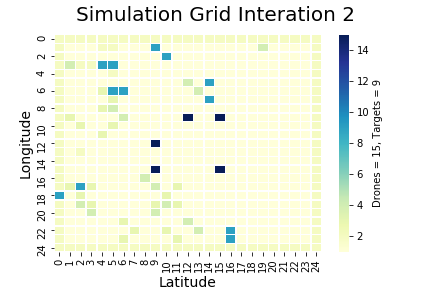

In [6]:
### Main driver
model = DroneSimulation(100, 25, 12)
fig = plt.figure()
def init():
    plt.clf()
    ax = sns.heatmap(model.worldMap.myMap, linewidth=0.5, cmap="YlGnBu")
def animate(i):
    model.clearCoords()
    model.step()
    dataCopy = copy.deepcopy(model.worldMap.myMap)
    plt.clf()
    for vals in model.droneCoords:
        dataCopy[vals[0]][vals[1]] = 15
    ax = sns.heatmap(dataCopy, linewidth=0.5, cmap="YlGnBu")
    ax.collections[0].colorbar.set_label('Drones = 15, Targets = 9')
    fig.suptitle('Simulation Grid Interation {}'.format(i), fontsize=20)
    plt.xlabel('Latitude', fontsize=14)
    plt.ylabel('Longitude', fontsize=14)
    plt.show()
    del(dataCopy)

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=10, interval=50, repeat = False)